TP1: 

1. Criação do script para a meta

In [ ]:
import numpy as np
import os
import matplotlib.pyplot as plt

from scipy.stats import skew, kurtosis, iqr, entropy
from scipy.fft import fft
from scipy.stats import kstest, ttest_ind, kruskal 

from sklearn.cluster import DBSCAN 
from sklearn.preprocessing import StandardScaler

import pandas as pd

In [ ]:
#Global variables
activities = {
        1: 'STAND',
        2: 'SIT',
        3: 'SIT AND TALK',
        4: 'WALK',
        5: 'WALK AND TALK',
        6: 'CLIMB STAIR (UP/DOWN)',
        7: 'CLIMB STAIR (UP/DOWN) AND TALK',
        8: 'STAND->SIT',
        9: 'SIT->STAND',
        10: 'STAND->SIT AND TALK',
        11: 'SIT->STAND AND TALK',
        12: 'STAND->WALK',
        13: 'WALK->STAND',
        14: 'STAND->CLIMB STAIRS (UP/DOWN), STAND->CLIMB STAIRS (UP/DOWN) AND TALK',
        15: 'CLIMB STAIRS (UP/DOWN)->WALK',
        16: 'CLIMB STAIRS (UP/DOWN) AND TALK->WALK AND TALK'
    }

2. Descarregar os dados através do link indicado em cima e elabore uma rotina que carregue 
os dados relativos a um indivíduo e os devolva num Array NumPy.

In [ ]:
def loadData(deviceId):
    """Carrega dados de todos os ficheiros CSV com tratamento de erros"""
    base_dir = '../dataset'
    dataset = {}
    
    if deviceId == None:
        for i in range(0, 15):
            folder = os.path.join(base_dir, f"part{i}")
            for j in range(1, 6):
                file = f"part{i}dev{j}.csv"
                path = os.path.join(folder, file)
                data = np.loadtxt(path, delimiter=',')
                if data is None:
                    continue

                dataset[f"part{i}dev{j}"] = data

    else:
        for i in range(0, 15):
            folder = os.path.join(base_dir, f"part{i}")
            file = f"part{i}dev{deviceId}.csv"
            path = os.path.join(folder, file)
            data = np.loadtxt(path, delimiter=',')

            if data is None:
                continue

            dataset[f"part{i}dev{deviceId}"] = data

    return dataset

Em primeiro lugar, começamos por produzir uma função de modo a podermos importar os dados do dataset. A função recebe como parâmetro o id do dispositivo de que queremos extrair os dados. Caso o mesmo venha a "None", são extraídos os dados de todos os dispositivos, de todos os participantes. Através do numpy, extraímos os dados e guardamos a informação num dicionário que tem como chave o nº de participante e dispositivo e valor os dados relativos ao dataset. Decidimos escolher o dicionário como estrutura de dados para guardar esta informação devido a questões de organização.

3.1. Elabore  uma  rotina  que  apresente  simultaneamente  o  boxplot  de  cada 
atividade (coluna 12 – eixo horizontal) relativo a todos os sujeitos e a cada uma 
seguintes  variáveis  transformadas  (módulos  dos  vetores  de  aceleração, 
giroscópio e magnetómetro) e separadas por dispositivo. Sugere-se o uso da 
biblioteca matplotlib, em particular a classe matplotlib.pyplot.boxplot. 

In [ ]:
def calculateModuleVariable(value1,value2,value3):
    return np.sqrt(value1**2 + value2**2 + value3**2)

def loadBoxPlotActivityAndVariable(data, sensor_type):

    if data is None:
        return
    
    # Definir colunas para cada sensor
    sensor_columns = {
        'acceleration': (1, 2, 3),
        'gyroscope': (4, 5, 6),
        'magnetometer': (7, 8, 9)
    }
    
    if sensor_type not in sensor_columns:
        print(f"Sensor type '{sensor_type}' não suportado.")
        return
    
    #obter as colunas corretas
    col_x, col_y, col_z = sensor_columns[sensor_type]
    activity_data = {}

    for key, values in data.items():
        for row in values:
            activity = int(row[11]) #buscar cada label de atividade
            
            #buscar os valores x,y,z do sensor que queremos
            x_val = row[col_x]
            y_val = row[col_y]
            z_val = row[col_z]
            
            #calcular o módulo com a formula que dão
            module = calculateModuleVariable(x_val, y_val, z_val)
            
            #adicionar o módulo ao dicionário de atividades
            if activity not in activity_data:
                activity_data[activity] = []
            activity_data[activity].append(module)
    
    
    #ordenar atividades para garantir consistência
    sorted_activities = sorted(activity_data.keys())
    
    boxplot_data = [activity_data[activity] for activity in sorted_activities]
    activity_labels = [activities.get(activity, f'Activity {activity}') for activity in sorted_activities]
    
    #fazer o boxplot
    plt.figure()
    plt.boxplot(boxplot_data)
    plt.xticks(range(1, len(activity_labels) + 1), activity_labels, rotation=45)
    plt.ylabel(f'{sensor_type.capitalize()} Module')
    plt.title(f'Boxplot - {sensor_type.capitalize()} Module by Activity')
    plt.show()
    
    return


=== Acelerómetro ===


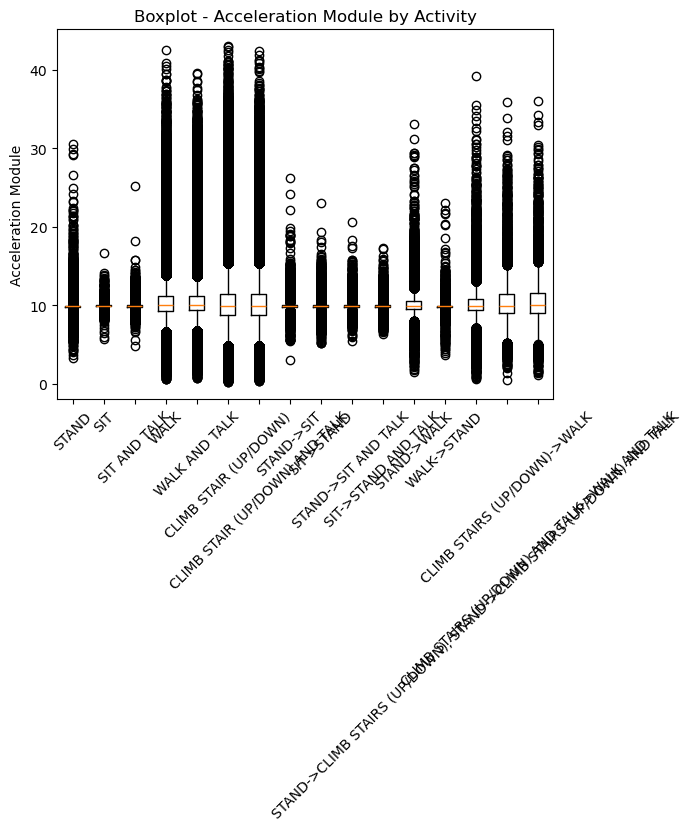


=== Giroscópio ===


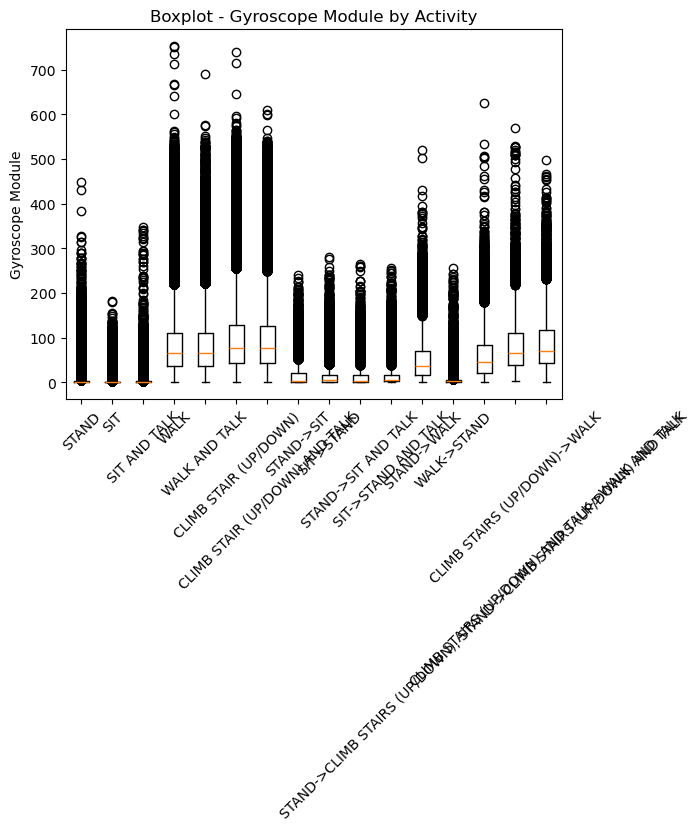


=== Magnetómetro ===


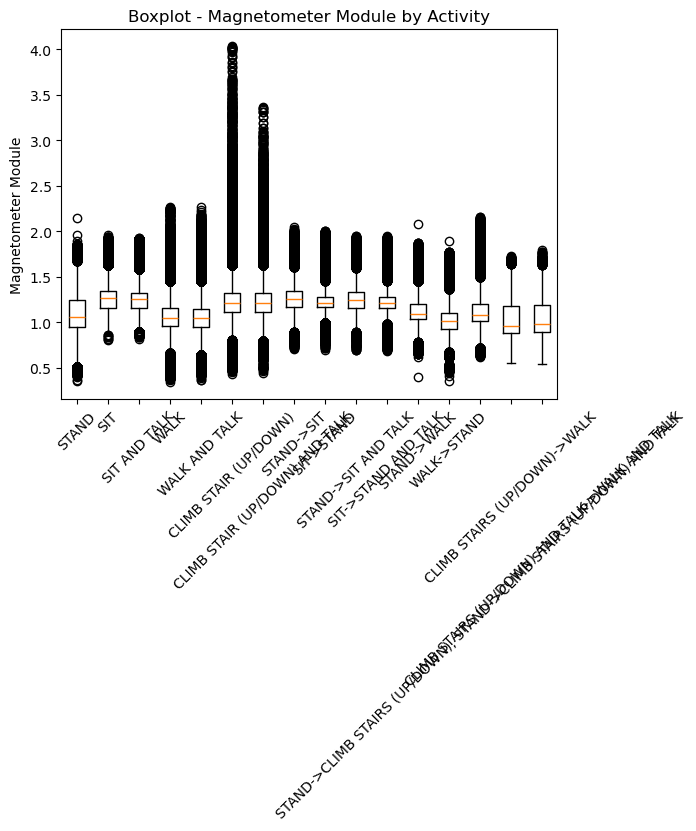

In [ ]:
# Célula para 3.1
def main_exercicio_3_1():
    """Boxplots de atividades"""
    dataset = loadData(None)
    
    if not dataset:
        print("Nenhum dado carregado!")
        return
    
    print("\n=== Acelerómetro ===")
    loadBoxPlotActivityAndVariable(dataset, 'acceleration')

    print("\n=== Giroscópio ===")
    loadBoxPlotActivityAndVariable(dataset, 'gyroscope')

    print("\n=== Magnetómetro ===")
    loadBoxPlotActivityAndVariable(dataset, 'magnetometer')

# Executar
main_exercicio_3_1()

Neste exercício, é possível visualizar a distribuição dos dados dos sensores (acelerómetro, giroscópio e magnetómetro) para cada tipo de atividade realizada pelos participantes, de modo a identificar padrões e possíveis outliers através de boxplots. Para esta relação, foi pedido para calcular o módulo de um vetor tridimensional, como é visível na função "calculateModuleVariable(value1,value2,value3)". Em vez de analisarmos separadamente os eixos X, Y e Z, o módulo representa a intensidade total do movimento. 

De modo a visualizar o boxplot, elaboramos a função "loadBoxPlotActivityAndVariable(data, sensor_type)", onde começamos por mapear cada tipo de sensor às suas colunas correspondentes no dataset. De seguida, usando a estrutura de dados carregada no exercício anterior, iteramos por todos os ficheiros de dados e extraímos a atividade e valores X,Y e Z do sensor especificado. Calculamos o módulo do vetor de três dimensões e agrupamos os dados por tipo de atividade num dicionário. Por fim, criamos uma lista de listas com os módulos de cada atividade e geramos labels para serem apresentados no boxplot, ao invés de números. Com o auxílio do matplotlib, geramos os boxplots.

Algo interessante que podemos concluir da visualização dos boxplots é que as atividades mais dinâmicas (walk, climb stairs, ...) têm maior variabilidade e mais outliers, enquanto que atividades mais estáticas (sit, stand, ...) são mais consistentes, com menor variabilidade e menos ruído. A diferença marcante entre atividades dinâmicas e estáticas nos boxplots reflete a natureza física dos movimentos humanos. Enquanto o repouso é caracterizado por estabilidade e previsibilidade, atividades como caminhar ou subir escadas envolvem padrões complexos, cíclicos e inerentemente variáveis.



### 3.2 Analise  e  comente  a  densidade  de  outliers  existentes  no  dataset transformado,  isto  é,  nos  módulos  dos  vetores  aceleração,  giroscópio e magnetómetro para cada atividade. Use somente os sensores do pulso direito, e  aplique  o  método  IQR  (definição  de  Tukey,  a  mesma  usada  por matplotlib.pyplot.boxplot). 

In [ ]:
def calculateDensity(no,nr):
    return (no/nr)*100

def outlierDensity(sensor_type):
    
    # Carregar dados apenas do device 2 (pulso direito)  
    dataset_right_pulse = loadData(2)
    
    if not dataset_right_pulse:
        print("Nenhum dado do pulso direito carregado!")
        return
    
    sensor_columns = {
        'acceleration': (1, 2, 3),
        'gyroscope': (4, 5, 6),
        'magnetometer': (7, 8, 9)
    }
    
    if sensor_type not in sensor_columns:
        print(f"Sensor type '{sensor_type}' não suportado.")
        return
    
    #obter as colunas corretas
    col_x, col_y, col_z = sensor_columns[sensor_type]
    activity_data = {}

    for key, values in dataset_right_pulse.items():
        for row in values:
            activity = int(row[11]) #buscar cada label de atividade
            
            #buscar os valores x,y,z do sensor que queremos
            x_val = row[col_x]
            y_val = row[col_y]
            z_val = row[col_z]
            
            #calcular o módulo com a formula que dão
            module = calculateModuleVariable(x_val, y_val, z_val)
            
            #adicionar o módulo ao dicionário de atividades
            if activity not in activity_data:
                activity_data[activity] = []
            activity_data[activity].append(module)

    for activity in sorted(activity_data.keys()):
        data_points = np.array(activity_data[activity])
        nr = len(data_points) #numero total de pontos da atividade

        #Calcular Q1, Q3 e IQR para detetar os outliers
        Q1 = np.percentile(data_points,25)
        Q3 = np.percentile(data_points,75)
        IQR = Q3 - Q1

        lower = Q1 - 1.5 * IQR
        upper = Q3 + 1.5 * IQR

        #detetar os outliers
        outliers = data_points[(data_points < lower) | (data_points > upper)]
        no = len(outliers)

        density = calculateDensity(no, nr)

        print(f"Atividade: {activities.get(activity, f'Activity {activity}')}, Densidade de Outliers: {density:.2f}% (Outliers: {no}, Total: {nr})")
    
    return

In [ ]:
def main_exercicio_3_2():
    """Análise de densidade de outliers"""
    print("\n=== Outliers Acelerómetro ===")
    outlierDensity('acceleration')

    print("\n=== Outliers Giroscópio ===")
    outlierDensity('gyroscope')

    print("\n=== Outliers Magnetómetro ===")
    outlierDensity('magnetometer')

main_exercicio_3_2()


=== Outliers Acelerómetro ===
Atividade: STAND, Densidade de Outliers: 4.20% (Outliers: 6624, Total: 157882)
Atividade: SIT, Densidade de Outliers: 0.22% (Outliers: 181, Total: 83968)
Atividade: SIT AND TALK, Densidade de Outliers: 0.51% (Outliers: 417, Total: 81152)
Atividade: WALK, Densidade de Outliers: 3.53% (Outliers: 4941, Total: 139934)
Atividade: WALK AND TALK, Densidade de Outliers: 3.48% (Outliers: 4951, Total: 142366)
Atividade: CLIMB STAIR (UP/DOWN), Densidade de Outliers: 5.17% (Outliers: 4616, Total: 89359)
Atividade: CLIMB STAIR (UP/DOWN) AND TALK, Densidade de Outliers: 4.51% (Outliers: 1977, Total: 43791)
Atividade: STAND->SIT, Densidade de Outliers: 15.44% (Outliers: 1028, Total: 6656)
Atividade: SIT->STAND, Densidade de Outliers: 19.80% (Outliers: 1115, Total: 5632)
Atividade: STAND->SIT AND TALK, Densidade de Outliers: 15.32% (Outliers: 1020, Total: 6656)
Atividade: SIT->STAND AND TALK, Densidade de Outliers: 18.32% (Outliers: 985, Total: 5376)
Atividade: STAND->WA

Neste exercício, procuramos calcular e exibir a densidade de outliers usando o método IQR de Tukey, aplicado exclusivamente aos dados do pulso direito. Primeiro, com a função elaborada anteriormente do "loadData", carregamos apenas os dados do pulso direito. De seguida, agrupamos módulos dos sensores por tipo de atividade e fazemos a deteção de outliers com o IQR. Depois, fazemos o cálculo da densidade através do número de outliers calculados e do número total de amostras.

Relativamente aos resultados obtidos, no acelerómetro, nas atividades estáticas (STAND, SIT, SIT AND TALK), verificam-se densidades relativamente baixas (há pouco movimento), porém verifica-se uma densidade surpreendentemente alta (4,20%) na STAND. Isto pode ter ocorrido devido à duração longa da atividade (157882 amostras), o que é mais oportuno para movimentos esporádicos. Além disso, quando se está de pé, há comportamentos naturais (ajustar o peso entre os pés, coçar, mexer o braço, pequenos desequilibrios), o que promove um maior ruído para os dados. Uma última justificação que se pode dar é comparando este valor com o do SIT (0.22%), pois quando se está sentado, há um maior apoio estrutural do corpo, algo que é menor quando se está de pé. Na atividades dinâmicas (WALK, WALK AND TALK, CLIMB STAIRS, CLIMB STAIRS AND TALK), verificam-se densidade mais altas que estáticas, rondando densidades de 3-5%. É de destacar a atividade de CLIMB STAIRS, que tem uma densidade mais alta que as restantes dinâmicas(5,17%) que ocorre devido a um esforço muscular variável que ocorre naturalmente quando se sobem escadas. Nas transições (SIT->STAND, STAND->SIT e STAND->WALK), a densidade é bastante mais alta, devido às mudanças abruptas de aceleração que ocorrem numa breve duração, por serem movimentos de transição (movimentos explosivos no SIT->STAND, movimentos de desaceleração no STAND->SIT e movimentos mais moderados e graduais no STAND->WALK).

No giroscópio, observa-se um comportamento inverso ao esperado. Nas atividades estáticas (STAND, SIT, SIT AND TALK), verificam-se densidades surpreendentemente elevadas (6.65%-9.48%), sendo a STAND a que apresenta maior densidade (9.48%). Este fenómeno aparentemente paradoxal pode ser explicado por três fatores principais: Primeiro, ao contrário do acelerómetro, o giroscópio mede velocidade angular, cujos valores em repouso estão centrados em zero. Qualquer pequena rotação do pulso (ajustar posição do braço, movimento involuntário, tremor natural) gera picos que, embora pequenos em magnitude absoluta. Segundo, a atividade SIT AND TALK (9.12%) apresenta densidade quase tão alta quanto STAND, o que se justifica pelos movimentos de cabeça durante a conversa. Quando se fala, há microrotações naturais da cabeça e consequente movimento do braço para gestos, que são captados como outliers devido ao baseline de repouso estar próximo de zero. Terceiro, e mais relevante, nas atividades dinâmicas (WALK, WALK AND TALK, CLIMB STAIRS) verificam-se densidades muito mais baixas (1.43%-2.07%), o que contraria a intuição mas tem justificação biomecânica. Durante a marcha, o balanço dos braços é cíclico e regular, com rotações que variam consistentemente entre 0.5-2.5 rad/s. É particularmente interessante notar que CLIMB STAIRS AND TALK (2.07%) apresenta densidade ligeiramente superior a CLIMB STAIRS (1.50%), o que sugere que falar durante esforço físico adiciona rotações extras (gestos compensatórios, ajustes posturais), mas ainda assim permanece abaixo das atividades estáticas devido ao padrão repetitivo dominante da subida de escadas. Nas transições (SIT->STAND, STAND->SIT, STAND->WALK), as densidades rondam 7-12%, valores intermédios entre estáticas e dinâmicas. Durante SIT->STAND (10.78%) e SIT->STAND AND TALK (11.87%), ocorrem rotações bruscas do pulso ao levantar (impulsão com os braços, ajuste de equilíbrio), gerando picos que se destacam da distribuição principal. A transição STAND->SIT (7.47%) apresenta densidade menor, pois o movimento de sentar é mais controlado, com desaceleração gradual.

No magnetómetro, os resultados revelam um padrão distinto e altamente dependente da orientação. A atividade STAND apresenta densidade nula (0.00%), um resultado notável que reflete a constância do campo magnético terrestre (~50-60 µT). Quando o braço permanece numa orientação fixa durante longos períodos, o módulo do vetor magnético é praticamente invariante, sem variações suficientes para gerar outliers. No entanto, SIT apresenta densidade inesperadamente alta (6.67%), superior até a algumas atividades dinâmicas. Este fenómeno justifica-se pelos ajustes posturais ao sentar-se: cruzar braços, apoiar cotovelo, mudar posição do pulso. Comparando com SIT AND TALK (4.77%), que apresenta densidade menor, conclui-se que falar reduz a frequência de ajustes posturais (o participante permanece mais fixo enquanto conversa), resultando em menos perturbações magnéticas.Nas atividades dinâmicas, WALK (1.45%) e WALK AND TALK (1.34%) apresentam densidades baixas e similares, indicando que o balanço cíclico dos braços durante a marcha gera mudanças de orientação previsíveis e regulares. Nas transições, observa-se heterogeneidade interessante. STAND->SIT (3.49%) e SIT->STAND (7.35%) apresentam densidades moderadas, refletindo as rotações do pulso durante a mudança de postura (apoiar mãos nos joelhos ao sentar, impulsão ao levantar). A densidade mais alta em SIT->STAND justifica-se pelo movimento mais dinâmico de levantar comparado ao sentar. Curiosamente, STAND->SIT AND TALK (0.84%) apresenta densidade muito mais baixa que STAND->SIT, possivelmente porque falar simultaneamente torna o movimento mais lento e controlado, reduzindo variações bruscas.

Esta análise multi-sensor evidencia que a densidade de outliers não reflete qualidade dos dados, mas sim a natureza física da interação entre o movimento humano e o tipo de medição. O IQR de Tukey, embora robusto para acelerómetro e magnetómetro, apresenta limitações para o giroscópio, sugerindo a necessidade de métodos alternativos (Z-Score, ...) para dados centrados em zero. As transições consistentemente apresentam densidades elevadas nos três sensores (7-20%), confirmando que mudanças de estado biomecânico são inerentemente variáveis e devem ser tratadas com thresholds mais permissivos ou segmentação temporal específica.

3.3 Escreva  uma  rotina  que  receba  um  Array  de  amostras  de  uma  variável  e 
identifique os outliers usando o teste Z-Score para um k variável (parâmetro 
de entrada)

In [ ]:
def Zscore(x, mean, std, k):

    # X é a amostra 
    zscore = (x-mean) / std

    # Caso esteja acima ou abaixo de K, retorna 1 (identifica o outlier)
    if(np.abs(zscore) > k):
        return 1
    
    else:
        return 0
    

def outliers(data, sensor_type, k):

    if data is None:
        return
    
    # Definir colunas para cada sensor
    sensor_columns = {
        'acceleration': (1, 2, 3),
        'gyroscope': (4, 5, 6),
        'magnetometer': (7, 8, 9)
    }
    
    if sensor_type not in sensor_columns:
        print(f"Sensor type '{sensor_type}' não suportado.")
        return
    
    #obter as colunas corretas
    col_x, col_y, col_z = sensor_columns[sensor_type]
    activity_data = {}

    for key, values in data.items():
        for row in values:
            activity = int(row[11]) #buscar cada label de atividade
            
            #buscar os valores x,y,z do sensor que queremos
            x_val = row[col_x]
            y_val = row[col_y]
            z_val = row[col_z]
            
            #calcular o módulo com a formula que dão
            module = calculateModuleVariable(x_val, y_val, z_val)
            
            #adicionar o módulo ao dicionário de atividades
            if activity not in activity_data:
                activity_data[activity] = []
            activity_data[activity].append(module)


    for activity in sorted(activity_data.keys()):
        data_points = np.array(activity_data[activity])
        nr = len(data_points) #numero total de pontos da atividade

        outliers_counter_activity = 0
        mean = np.mean(activity_data[activity])
        std = np.std(activity_data[activity])

        for i in activity_data[activity]:

            if(Zscore(i, mean, std, k)):
                outliers_counter_activity += 1
        
        print(f"Atividade: {activities.get(activity, f'Activity {activity}')}, Outliers: {outliers_counter_activity}, Total: {nr}")

Para este exercício, usamos o teste Z-score para um k variável de modo a identificar outliers. Na função "Zscore(x, mean, std, k)" calculamos o Z-score da amostra x usando a fórmula zscore = (x - mean) / std e verificamos se o valor absoluto (sem sinal) do zscore calculado é maior que k. Retorna 1 (identificado como outlier) se abs(zscore) > k, ou 0 (não é outlier) caso contrário. A função "outliers(data, sensor_type, k)" é uma implementação prática que utiliza a rotina Zscore para analisar os dados do dataset (como preparação para o exercício 3.4). Aqui, começamos por processar o dataset completo e tal como no exercício 3.1, calculamos o módulo (intensidade total) para o sensor_type especificado (acelerómetro, giroscópio ou magnetómetro) e agrupamos esses módulos por atividade. De seguida, para cada atividade, calcula a média (mean) e o desvio padrão (std) de todos os módulos dessa atividade, itera por cada amostra (i) dessa atividade e chama a função Zscore(i, mean, std, k). Conta o número de vezes que a função Zscore retorna 1 e no final, imprime o número total de outliers encontrados para essa atividade, juntamente com o número total de amostras.

3.4 Usando  o  Z-score  implementado,  assinale  todas  as  amostras  consideradas 
outliers nos módulos dos vetores de aceleração, giroscópio e magnetómetro. 
Apresente  plots  separados  por  atividade  (análogos  à  pergunta  3.1)  em  que 
estes pontos surgem a vermelho, enquanto os restantes surgem a azul. Use 
k=3, 3.5 e 4.

VISUALIZAÇÃO DE OUTLIERS COM Z-SCORE
✅ Dataset carregado: 15 arquivos


SENSOR: ACELERÓMETRO

────────────────────────────────────────────────────────────────────────────────
Análise com k = 3
────────────────────────────────────────────────────────────────────────────────
A processar dados de acceleration...
A gerar plots para 16 atividades...

   STAND                                         | Outliers:  1328 ( 0.84%) | Total: 157882
   SIT                                           | Outliers:   199 ( 0.24%) | Total:  83968
   SIT AND TALK                                  | Outliers:   295 ( 0.36%) | Total:  81152
   WALK                                          | Outliers:  1497 ( 1.07%) | Total: 139934
   WALK AND TALK                                 | Outliers:  1522 ( 1.07%) | Total: 142366
   CLIMB STAIR (UP/DOWN)                         | Outliers:  1163 ( 1.30%) | Total:  89359
   CLIMB STAIR (UP/DOWN) AND TALK                | Outliers:   595 ( 1.36%) | Total:  43791
   STAND

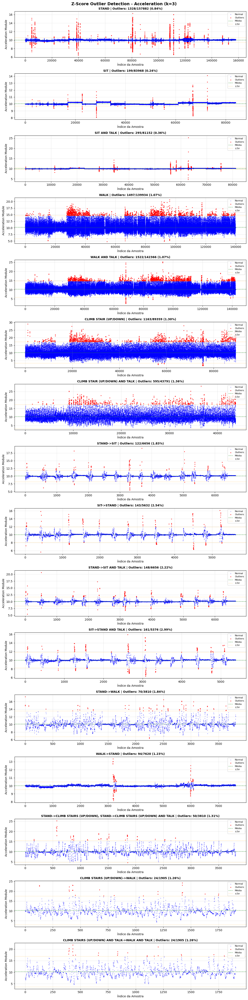


Plots gerados com sucesso!

────────────────────────────────────────────────────────────────────────────────
Análise com k = 3.5
────────────────────────────────────────────────────────────────────────────────
A processar dados de acceleration...
A gerar plots para 16 atividades...

   STAND                                         | Outliers:  1123 ( 0.71%) | Total: 157882
   SIT                                           | Outliers:   173 ( 0.21%) | Total:  83968
   SIT AND TALK                                  | Outliers:   245 ( 0.30%) | Total:  81152
   WALK                                          | Outliers:   681 ( 0.49%) | Total: 139934
   WALK AND TALK                                 | Outliers:   720 ( 0.51%) | Total: 142366
   CLIMB STAIR (UP/DOWN)                         | Outliers:   573 ( 0.64%) | Total:  89359
   CLIMB STAIR (UP/DOWN) AND TALK                | Outliers:   292 ( 0.67%) | Total:  43791
   STAND->SIT                                    | Outliers:    91 ( 1.

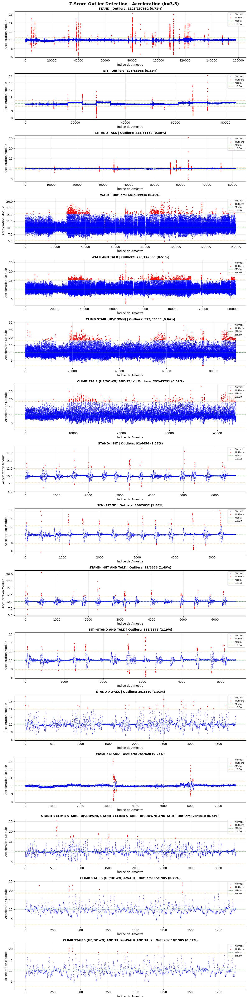


Plots gerados com sucesso!

────────────────────────────────────────────────────────────────────────────────
Análise com k = 4
────────────────────────────────────────────────────────────────────────────────
A processar dados de acceleration...
A gerar plots para 16 atividades...

   STAND                                         | Outliers:   977 ( 0.62%) | Total: 157882
   SIT                                           | Outliers:   155 ( 0.18%) | Total:  83968
   SIT AND TALK                                  | Outliers:   216 ( 0.27%) | Total:  81152
   WALK                                          | Outliers:   283 ( 0.20%) | Total: 139934
   WALK AND TALK                                 | Outliers:   302 ( 0.21%) | Total: 142366
   CLIMB STAIR (UP/DOWN)                         | Outliers:   288 ( 0.32%) | Total:  89359
   CLIMB STAIR (UP/DOWN) AND TALK                | Outliers:   152 ( 0.35%) | Total:  43791
   STAND->SIT                                    | Outliers:    76 ( 1.14

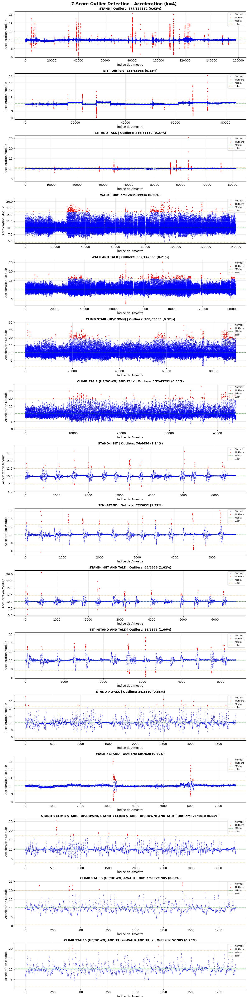


Plots gerados com sucesso!

SENSOR: GIROSCÓPIO

────────────────────────────────────────────────────────────────────────────────
Análise com k = 3
────────────────────────────────────────────────────────────────────────────────
A processar dados de gyroscope...
A gerar plots para 16 atividades...

   STAND                                         | Outliers:  2348 ( 1.49%) | Total: 157882
   SIT                                           | Outliers:   392 ( 0.47%) | Total:  83968
   SIT AND TALK                                  | Outliers:   518 ( 0.64%) | Total:  81152
   WALK                                          | Outliers:  1274 ( 0.91%) | Total: 139934
   WALK AND TALK                                 | Outliers:  1235 ( 0.87%) | Total: 142366
   CLIMB STAIR (UP/DOWN)                         | Outliers:   810 ( 0.91%) | Total:  89359
   CLIMB STAIR (UP/DOWN) AND TALK                | Outliers:   480 ( 1.10%) | Total:  43791
   STAND->SIT                                    | Outli

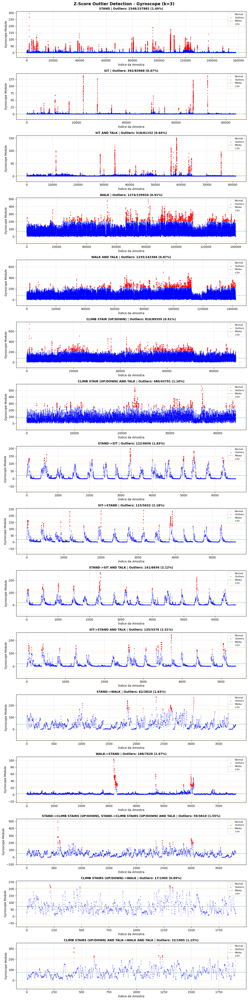


Plots gerados com sucesso!

────────────────────────────────────────────────────────────────────────────────
Análise com k = 3.5
────────────────────────────────────────────────────────────────────────────────
A processar dados de gyroscope...
A gerar plots para 16 atividades...

   STAND                                         | Outliers:  2003 ( 1.27%) | Total: 157882
   SIT                                           | Outliers:   356 ( 0.42%) | Total:  83968
   SIT AND TALK                                  | Outliers:   459 ( 0.57%) | Total:  81152
   WALK                                          | Outliers:   700 ( 0.50%) | Total: 139934
   WALK AND TALK                                 | Outliers:   691 ( 0.49%) | Total: 142366
   CLIMB STAIR (UP/DOWN)                         | Outliers:   426 ( 0.48%) | Total:  89359
   CLIMB STAIR (UP/DOWN) AND TALK                | Outliers:   266 ( 0.61%) | Total:  43791
   STAND->SIT                                    | Outliers:    56 ( 0.84%

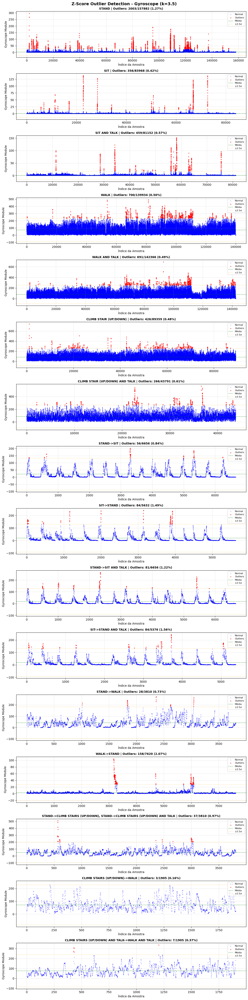


Plots gerados com sucesso!

────────────────────────────────────────────────────────────────────────────────
Análise com k = 4
────────────────────────────────────────────────────────────────────────────────
A processar dados de gyroscope...
A gerar plots para 16 atividades...

   STAND                                         | Outliers:  1744 ( 1.10%) | Total: 157882
   SIT                                           | Outliers:   323 ( 0.38%) | Total:  83968
   SIT AND TALK                                  | Outliers:   413 ( 0.51%) | Total:  81152
   WALK                                          | Outliers:   421 ( 0.30%) | Total: 139934
   WALK AND TALK                                 | Outliers:   395 ( 0.28%) | Total: 142366
   CLIMB STAIR (UP/DOWN)                         | Outliers:   201 ( 0.22%) | Total:  89359
   CLIMB STAIR (UP/DOWN) AND TALK                | Outliers:   161 ( 0.37%) | Total:  43791
   STAND->SIT                                    | Outliers:    27 ( 0.41%) 

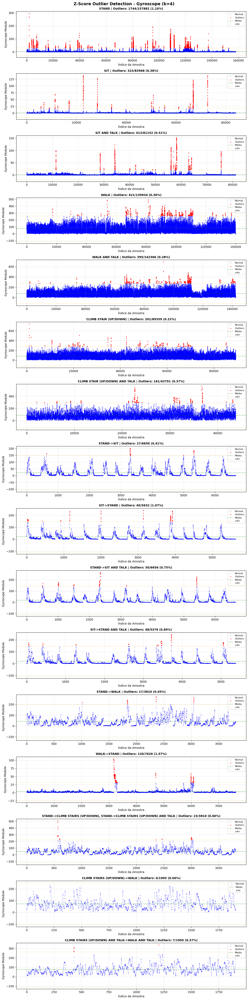


Plots gerados com sucesso!

SENSOR: MAGNETÓMETRO

────────────────────────────────────────────────────────────────────────────────
Análise com k = 3
────────────────────────────────────────────────────────────────────────────────
A processar dados de magnetometer...
A gerar plots para 16 atividades...

   STAND                                         | Outliers:     0 ( 0.00%) | Total: 157882
   SIT                                           | Outliers:     1 ( 0.00%) | Total:  83968
   SIT AND TALK                                  | Outliers:     0 ( 0.00%) | Total:  81152
   WALK                                          | Outliers:   116 ( 0.08%) | Total: 139934
   WALK AND TALK                                 | Outliers:    92 ( 0.06%) | Total: 142366
   CLIMB STAIR (UP/DOWN)                         | Outliers:   441 ( 0.49%) | Total:  89359
   CLIMB STAIR (UP/DOWN) AND TALK                | Outliers:   160 ( 0.37%) | Total:  43791
   STAND->SIT                                    | 

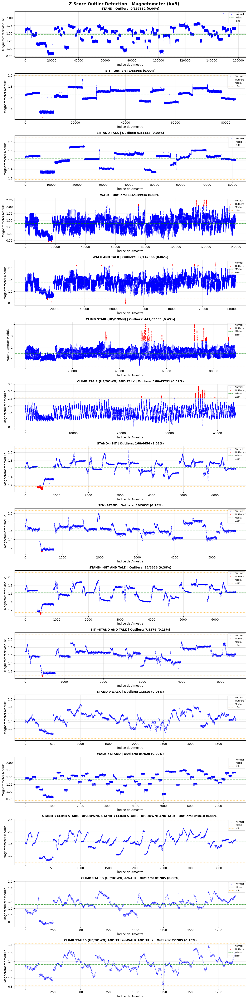


Plots gerados com sucesso!

────────────────────────────────────────────────────────────────────────────────
Análise com k = 3.5
────────────────────────────────────────────────────────────────────────────────
A processar dados de magnetometer...
A gerar plots para 16 atividades...

   STAND                                         | Outliers:     0 ( 0.00%) | Total: 157882
   SIT                                           | Outliers:     1 ( 0.00%) | Total:  83968
   SIT AND TALK                                  | Outliers:     0 ( 0.00%) | Total:  81152
   WALK                                          | Outliers:    41 ( 0.03%) | Total: 139934
   WALK AND TALK                                 | Outliers:    28 ( 0.02%) | Total: 142366
   CLIMB STAIR (UP/DOWN)                         | Outliers:   322 ( 0.36%) | Total:  89359
   CLIMB STAIR (UP/DOWN) AND TALK                | Outliers:    89 ( 0.20%) | Total:  43791
   STAND->SIT                                    | Outliers:    16 ( 0.

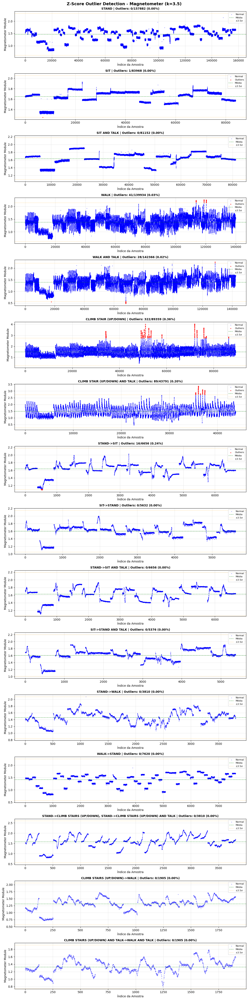


Plots gerados com sucesso!

────────────────────────────────────────────────────────────────────────────────
Análise com k = 4
────────────────────────────────────────────────────────────────────────────────
A processar dados de magnetometer...
A gerar plots para 16 atividades...

   STAND                                         | Outliers:     0 ( 0.00%) | Total: 157882
   SIT                                           | Outliers:     0 ( 0.00%) | Total:  83968
   SIT AND TALK                                  | Outliers:     0 ( 0.00%) | Total:  81152
   WALK                                          | Outliers:     3 ( 0.00%) | Total: 139934
   WALK AND TALK                                 | Outliers:     0 ( 0.00%) | Total: 142366
   CLIMB STAIR (UP/DOWN)                         | Outliers:   200 ( 0.22%) | Total:  89359
   CLIMB STAIR (UP/DOWN) AND TALK                | Outliers:    42 ( 0.10%) | Total:  43791
   STAND->SIT                                    | Outliers:     0 ( 0.00

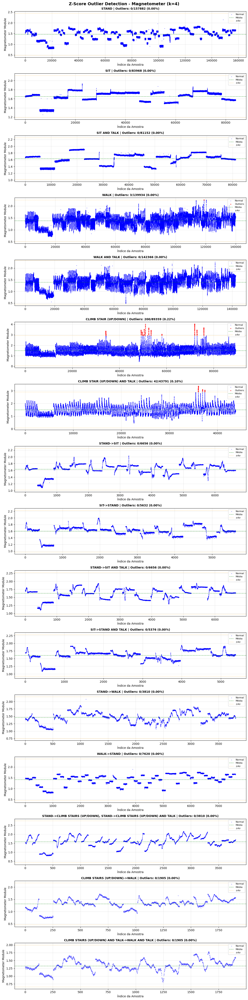


Plots gerados com sucesso!

✅ ANÁLISE COMPLETA!


In [ ]:
def plot_outliers_zscore(data, sensor_type, k):
    """
    Plota os dados separados por atividade, com outliers em vermelho e dados normais em azul.
    
    Parameters:
        data: dataset completo
        sensor_type: 'acceleration', 'gyroscope' ou 'magnetometer'
        k: threshold do Z-Score
    """
    
    if data is None:
        print("Data is None!")
        return
    
    # Definir colunas para cada sensor
    sensor_columns = {
        'acceleration': (1, 2, 3),
        'gyroscope': (4, 5, 6),
        'magnetometer': (7, 8, 9)
    }
    
    if sensor_type not in sensor_columns:
        print(f"Sensor type '{sensor_type}' não suportado.")
        return
    
    # Obter as colunas corretas
    col_x, col_y, col_z = sensor_columns[sensor_type]
    activity_data = {}
    
    # Coletar dados por atividade
    print(f"A processar dados de {sensor_type}...")
    for key, values in data.items():
        for row in values:
            activity = int(row[11])  # label de atividade
            
            # Buscar os valores x,y,z do sensor
            x_val = row[col_x]
            y_val = row[col_y]
            z_val = row[col_z]
            
            # Calcular o módulo
            module = calculateModuleVariable(x_val, y_val, z_val)
            
            # Adicionar ao dicionário de atividades
            if activity not in activity_data:
                activity_data[activity] = []
            activity_data[activity].append(module)
    
    # Criar subplots - uma linha por atividade
    n_activities = len(activity_data)
    fig, axes = plt.subplots(n_activities, 1, figsize=(12, 3 * n_activities))
    
    # Garantir que axes é sempre uma lista (mesmo com 1 subplot)
    if n_activities == 1:
        axes = [axes]
    
    print(f"A gerar plots para {n_activities} atividades...\n")
    
    # Plotar cada atividade
    for idx, activity in enumerate(sorted(activity_data.keys())):
        data_points = np.array(activity_data[activity])
        nr = len(data_points)
        
        # Calcular média e desvio padrão
        mean = np.mean(data_points)
        std = np.std(data_points)
        
        # Identificar outliers
        outlier_mask = np.abs((data_points - mean) / std) > k
        
        normal_points = data_points[~outlier_mask]
        outlier_points = data_points[outlier_mask]
        
        no = len(outlier_points)
        density = (no / nr) * 100
        
        # Criar índices para o eixo X
        normal_indices = np.where(~outlier_mask)[0]
        outlier_indices = np.where(outlier_mask)[0]
        
        # Plotar
        ax = axes[idx]
        
        # Pontos normais (azul)
        ax.scatter(normal_indices, normal_points, c='blue', s=1, alpha=0.5, label='Normal')
        
        # Outliers (vermelho)
        if len(outlier_points) > 0:
            ax.scatter(outlier_indices, outlier_points, c='red', s=3, alpha=0.8, label='Outliers')
        
        # Linhas de referência (média e thresholds)
        ax.axhline(y=mean, color='green', linestyle='--', linewidth=1, alpha=0.7, label='Média')
        ax.axhline(y=mean + k*std, color='orange', linestyle=':', linewidth=1, alpha=0.7, label=f'±{k}σ')
        ax.axhline(y=mean - k*std, color='orange', linestyle=':', linewidth=1, alpha=0.7)
        
        # Configurar o plot
        activity_name = activities.get(activity, f'Activity {activity}')
        ax.set_title(f'{activity_name} | Outliers: {no}/{nr} ({density:.2f}%)', fontsize=10, fontweight='bold')
        ax.set_xlabel('Índice da Amostra')
        ax.set_ylabel(f'{sensor_type.capitalize()} Module')
        ax.legend(loc='upper right', fontsize=8)
        ax.grid(True, alpha=0.3)
        
        # Estatísticas no console
        print(f"   {activity_name:45} | Outliers: {no:5d} ({density:5.2f}%) | Total: {nr:6d}")
    
    # Título geral
    fig.suptitle(f'Z-Score Outlier Detection - {sensor_type.capitalize()} (k={k})', 
                 fontsize=14, fontweight='bold', y=0.995)
    
    plt.tight_layout()
    plt.show()
    
    print(f"\nPlots gerados com sucesso!")


def main_exercicio_3_3_plots():
    """
    Gera plots de outliers usando Z-Score para diferentes valores de k.
    Mostra outliers em VERMELHO e dados normais em AZUL.
    """
    print("VISUALIZAÇÃO DE OUTLIERS COM Z-SCORE")
    
    dataset = loadData(2)
    
    if not dataset:
        print("Nenhum dado carregado!")
        return
    
    print(f"✅ Dataset carregado: {len(dataset)} arquivos\n")
    
    # Valores de k para testar
    K_values = [3, 3.5, 4]
    
    # Tipos de sensores
    sensors = [
        ('acceleration', 'Acelerómetro'),
        ('gyroscope', 'Giroscópio'),
        ('magnetometer', 'Magnetómetro')
    ]
    
    # Para cada sensor e cada k
    for sensor_type, sensor_name in sensors:
        print("\n" + "="*80)
        print(f"SENSOR: {sensor_name.upper()}")
        print("="*80)
        
        for k_value in K_values:
            print(f"\n{'─'*80}")
            print(f"Análise com k = {k_value}")
            print(f"{'─'*80}")
            
            plot_outliers_zscore(dataset, sensor_type, k_value)
            
            # Pequena pausa para processar os plots
            import time
            time.sleep(0.5)
    
    print("\n" + "="*80)
    print("✅ ANÁLISE COMPLETA!")
    print("="*80)


# Executar
main_exercicio_3_3_plots()

Neste exercício, o objetivo principal é assinalar visualmente quais amostras, nos módulos dos vetores de aceleração, giroscópio e magnetómetro, são consideradas outliers. Esta análise é efetuada para três valores distintos do limiar k: 3, 3.5 e 4. 

A implementação foca-se na função plot_zscore_outliers(data, sensor_type, k). Esta rotina começa por processar o conjunto de dados completo, agrupando os módulos do sensor especificado por cada uma das 16 atividades. Para cada atividade, calcula a sua própria média (mean) e desvio padrão (std). De seguida, o código itera individualmente por cada amostra (ponto de dados) dentro dessa atividade e utiliza a função Zscore (definida na secção 3.3) para determinar se essa amostra é um outlier, comparando o seu Z-score com o limiar k fornecido.

Com base na classificação (outlier ou inlier), os pontos são separados. A função gera então gráficos de dispersão (scatter plots), um para cada atividade. Nestes gráficos, as amostras consideradas "inliers" (dentro do normal) são coloridas a azul, enquanto as amostras identificadas como "outliers" (fora do limiar k) são destacadas a vermelho, conforme solicitado no enunciado. Adicionalmente, o código imprime no output a contagem e a percentagem de outliers encontrados para essa atividade específica. A execução final é gerida pela função main_exercicio_3_4, que carrega o dataset completo (loadData(None)) e chama a rotina de plotagem para cada um dos três sensores, repetindo o processo para os valores de k 3, 3.5 e 4.

3.5 Compare  e  discuta  os  resultados  obtidos  em  3.1  e  3.4  somente  para  os 
sensores  do  pulso  direito,  bem  como  as  respetivas  densidades  de  outliers 
obtidas com os dois métodos.

Explicação 3.5

3.6. Elabore  uma  rotina  que  implemente  o  algoritmo  k-means  para  n  (valor  de 
entrada) clusters.

In [ ]:
def kmeans(X, n_clusters, max_iters=300):

    # Inicializar os centróides aleatoriamente, escolhendo n_clusters pontos de dados aleatoriamente

    centroids = X[np.random.choice(X.shape[0], n_clusters, replace=False)]

    for _ in range(max_iters):

        distances = np.linalg.norm(X[:, np.newaxis] - centroids, axis=2)
        labels = np.argmin(distances, axis=1)

        new_centroids = np.array([X[labels == k].mean(axis=0) for k in range(n_clusters)])
        if np.all(centroids == new_centroids):
            break
        centroids = new_centroids

    # Separar os pontos de dados para cada centróide considerando a distância

    clusters = [X[labels == k] for k in range(n_clusters)]

    return centroids, clusters, labels

Explicação 3.6

3.7 Determine os outliers no dataset transformado usando o k-means. Para tal, 
pode usar o espaço dos módulos dos sensores ou o espaço original dos valores 
nos eixos x, y e z. Experimente diferentes números de clusters e compare com 
os  resultados  obtidos  em  3.4.  Ilustre  graficamente  os  resultados  usando 
gráficos  3D  para  cada  vetor

In [ ]:
def kmeansVisualization(data, n_clusters):

    sensors_types = ['acceleration', 'gyroscope', 'magnetometer']
    activities_data = []

    if data is None:
        return
    
    for sensor_type in sensors_types:
        # Definir colunas para cada sensor
        sensor_columns = {
            'acceleration': (1, 2, 3),
            'gyroscope': (4, 5, 6),
            'magnetometer': (7, 8, 9)
        }
        
        if sensor_type not in sensor_columns:
            print(f"Sensor type '{sensor_type}' não suportado.")
            return
        
        #obter as colunas corretas
        col_x, col_y, col_z = sensor_columns[sensor_type]
        activity_data = {}

        for key, values in data.items():
            for row in values:
                activity = int(row[11]) #buscar cada label de atividade
                
                #buscar os valores x,y,z do sensor que queremos
                x_val = row[col_x]
                y_val = row[col_y]
                z_val = row[col_z]
                
                #calcular o módulo com a formula que dão
                module = calculateModuleVariable(x_val, y_val, z_val)
                
                #adicionar o módulo ao dicionário de atividades
                if activity not in activity_data:
                    activity_data[activity] = []
                activity_data[activity].append(module)
        
        activities_data.append(activity_data)

    for activity in sorted(activity_data.keys()):
        data_acceleration = np.array(activities_data[0][activity])  #usar os dados do acelerómetro para k-means
        data_gyroscope = np.array(activities_data[1][activity])
        data_magnetometer = np.array(activities_data[2][activity])

        # Montar pontos de dados 3D

        X = np.vstack((data_acceleration, data_gyroscope, data_magnetometer)).T

        centroids, clusters, labels = kmeans(X, n_clusters=n_clusters)

        print("Centroides Finais: ")
        print(centroids)
        print(clusters)
        print(labels)
        
        fig = plt.figure()
        ax = fig.add_subplot(111, projection='3d')
        colors = ['blue', 'green', 'orange', 'purple', 'cyan', 'magenta']
        outlier_label_added = False

        for i, cluster in enumerate(clusters):
            color = colors[i % len(colors)]
            centroid = centroids[i]

            # Ignorar clusters vazios
            if len(cluster) == 0:
                continue

            # Calcular a distância de cada ponto ao seu centroide
            distances = np.linalg.norm(cluster - centroid, axis=1)
            
            # Encontrar o limiar para os 5% mais distantes (95º percentil)
            threshold = np.percentile(distances, 95)
            
            # Separar pontos "core" e "outliers"
            core_points = cluster[distances < threshold]
            outlier_points = cluster[distances >= threshold]

            # Plotar os pontos do cluster
            ax.scatter(core_points[:, 0], core_points[:, 1], core_points[:, 2], c=color, marker='.', label=f'Cluster {i}')
            
            # Plotar os 5% mais distantes com um 'X' preto
            ax.scatter(outlier_points[:, 0], outlier_points[:, 1], outlier_points[:, 2], c='black', marker='x', label='Outliers (Top 5%)' if not outlier_label_added else "")
            outlier_label_added = True

        ax.set_xlabel('Acceleration Module')
        ax.set_ylabel('Gyroscope Module')
        ax.set_zlabel('Magnetometer Module')
        ax.set_title(f'K-Means Clustering - {activities.get(activity, f"Activity {activity}")}')
        ax.legend()
    
    plt.show()


=== K-Means com 3 clusters ===


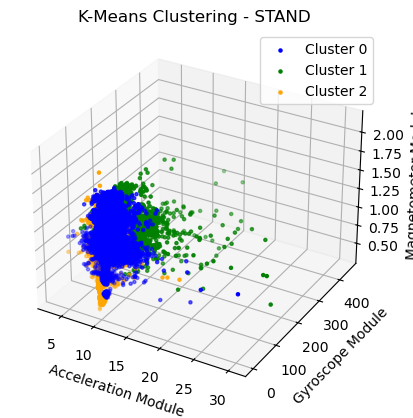

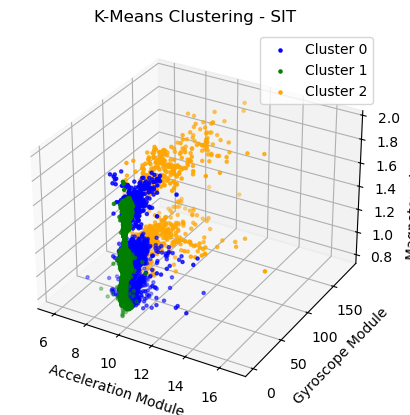

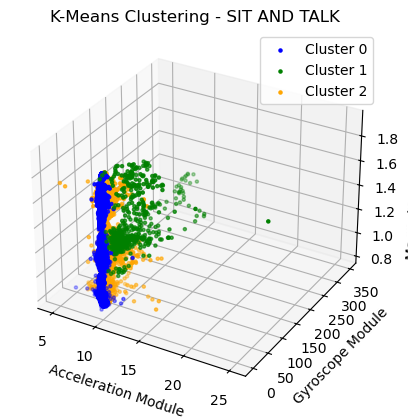

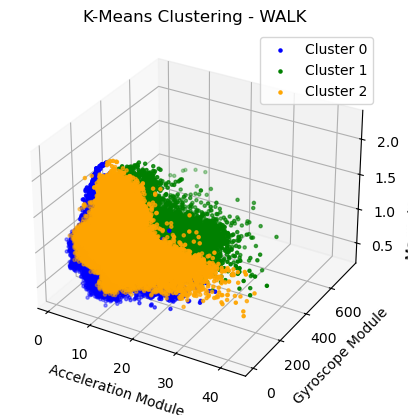

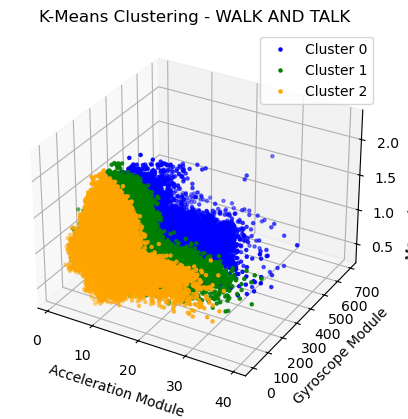

...

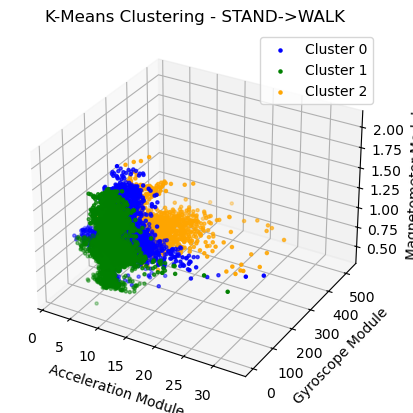

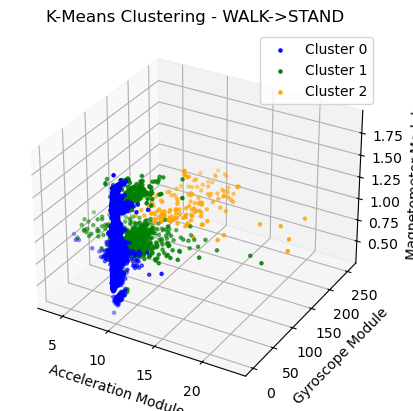

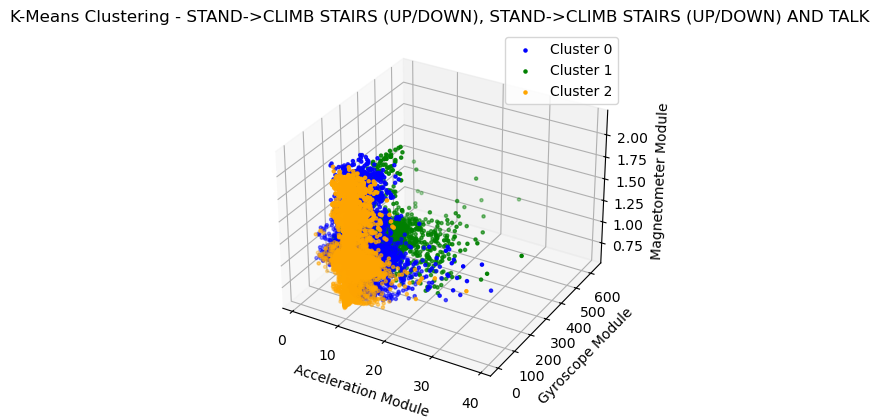

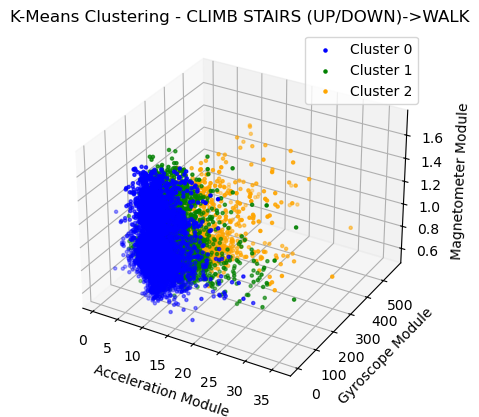

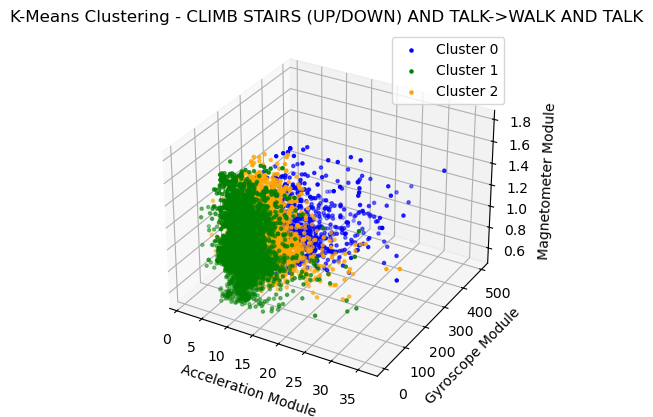


=== K-Means com 4 clusters ===


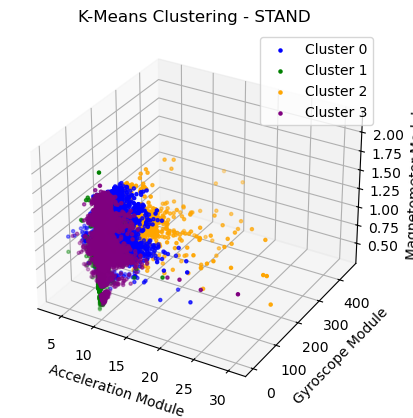

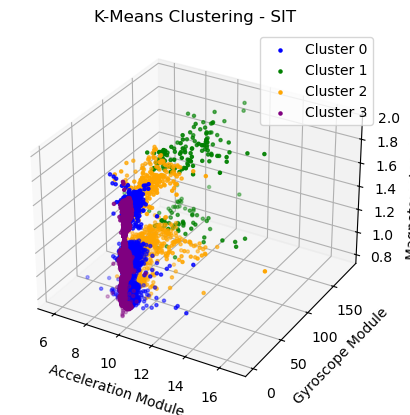

KeyboardInterrupt: 

In [ ]:
def main_exercicio_3_6():
    """Executa k-means e visualiza os resultados"""
    dataset = loadData(None)
    
    if not dataset:
        print("Nenhum dado carregado!")
        return
    n_clusters = [3,4,5]

    for n in n_clusters:
        print(f"\n=== K-Means com {n} clusters ===")
        kmeansVisualization(dataset, n)

main_exercicio_3_6()

3.7.1 Bónus:  poderá  realizar  um  estudo  análogo  usando  o  algoritmo 
DBSCAN

In [ ]:
def dbscan(data, epslon, min_samples):

    #normalizar os dados
    scaler = StandardScaler()
    data_scaled = scaler.fit_transform(data)

    #aplicar o dbscan
    dbscan = DBSCAN(eps=epslon, min_samples=min_samples)
    labels = dbscan.fit_predict(data_scaled) #cluster labels para cada ponto no dataset

    existe_outlier = 0

    if -1 in labels:
        existe_outlier = 1

    n_clusters = len(set(labels)) - existe_outlier
    n_noise = list(labels).count(-1)

    return labels, n_clusters, n_noise

In [ ]:
def dbscanVisualization(data):

    sensors_types = ['acceleration', 'gyroscope', 'magnetometer']
    activities_data = []

    if data is None:
        return
    
    for sensor_type in sensors_types:
        # Definir colunas para cada sensor
        sensor_columns = {
            'acceleration': (1, 2, 3),
            'gyroscope': (4, 5, 6),
            'magnetometer': (7, 8, 9)
        }
        
        if sensor_type not in sensor_columns:
            print(f"Sensor type '{sensor_type}' não suportado.")
            return
        
        #obter as colunas corretas
        col_x, col_y, col_z = sensor_columns[sensor_type]
        activity_data = {}

        for key, values in data.items():
            for row in values:
                activity = int(row[11]) #buscar cada label de atividade
                
                #buscar os valores x,y,z do sensor que queremos
                x_val = row[col_x]
                y_val = row[col_y]
                z_val = row[col_z]
                
                #calcular o módulo com a formula que dão
                module = calculateModuleVariable(x_val, y_val, z_val)
                
                #adicionar o módulo ao dicionário de atividades
                if activity not in activity_data:
                    activity_data[activity] = []
                activity_data[activity].append(module)
        
        activities_data.append(activity_data)
    
    #testar diferentes valores do epslon e do min_samples para ver o que dá melhor
    valores_epslon = [0.3,0.5, 1.0]
    valores_min_samples = [5,10,15]


    for activity in sorted(activity_data.keys()):
        data_acceleration = np.array(activities_data[0][activity]) 
        data_gyroscope = np.array(activities_data[1][activity])
        data_magnetometer = np.array(activities_data[2][activity])

        X = np.vstack((data_acceleration, data_gyroscope, data_magnetometer)).T
        
        # REDUZIR MEMÓRIA: Se houver muitos dados, fazer amostragem
        max_samples = 30000  # Limitar a 30k pontos para evitar MemoryError
        if X.shape[0] > max_samples:
            print(f" Atividade {activities.get(activity, f'Activity {activity}')} tem {X.shape[0]} pontos. Reduzindo para {max_samples}...")
            indices = np.random.choice(X.shape[0], max_samples, replace=False)
            X = X[indices]

        #procurar a melhor configuração do dbscan, testar com vários valores de epslon e min_samples
        best_eps = 0
        best_min_samples = 0
        best_n_clusters = 0
        
        print(f"\n🔍 Testando configurações DBSCAN para atividade: {activities.get(activity, f'Activity {activity}')} ({X.shape[0]} pontos)")

        for eps in valores_epslon:
            for min_samples in valores_min_samples:
                print(f"   Testando eps={eps}, min_samples={min_samples}...", end=" ")
                labels, n_clusters, n_noise = dbscan(X, eps, min_samples)
                print(f"✓ clusters={n_clusters}, noise={n_noise}")

                if n_clusters > best_n_clusters and n_clusters <= 4:
                    best_n_clusters = n_clusters
                    best_eps = eps
                    best_min_samples = min_samples
        
        #aplicar a melhor configuração do dbscan
        labels_dbscan, n_clusters_dbscan, n_noise_dbscan = dbscan(X, best_eps, best_min_samples)

        print(f"Atividade: {activities.get(activity, f'Activity {activity}')}, Epslon: {best_eps}, Min Samples: {best_min_samples}, Clusters: {n_clusters_dbscan}, Outliers: {n_noise_dbscan}")

        #visualizar os resultados do DBSCAN
        fig = plt.figure()
        ax = fig.add_subplot(111, projection='3d')
        unique_labels = set(labels_dbscan)
        colors = plt.cm.Spectral(np.linspace(0, 1, len(unique_labels)))
            
        for label, color in zip(unique_labels, colors):
            if label == -1:
                # Pontos de ruído em preto
                class_member_mask = (labels_dbscan == label)
                xy = X[class_member_mask]
                ax.scatter(xy[:, 0], xy[:, 1], xy[:, 2], 
                            c='black', marker='x', s=20, alpha=0.6, label='Noise')
            else:
                class_member_mask = (labels_dbscan == label)
                xy = X[class_member_mask]
                ax.scatter(xy[:, 0], xy[:, 1], xy[:, 2], 
                            c=[color], marker='o', s=20, alpha=0.8, label=f'Cluster {label}')

        
        ax.set_xlabel('Acceleration')
        ax.set_ylabel('Gyroscope')
        ax.set_zlabel('Magnetometer')
        ax.set_title(f'DBSCAN Clustering - {activities.get(activity, f"Activity {activity}")}')
        ax.legend()
        plt.show()

        


=== DBSCAN Clustering ===
 Atividade STAND tem 805541 pontos. Reduzindo para 30000...

🔍 Testando configurações DBSCAN para atividade: STAND (30000 pontos)
   Testando eps=0.3, min_samples=5... ✓ clusters=6, noise=644
   Testando eps=0.3, min_samples=10... ✓ clusters=2, noise=842
   Testando eps=0.3, min_samples=15... ✓ clusters=2, noise=973
   Testando eps=0.5, min_samples=5... ✓ clusters=5, noise=442
   Testando eps=0.5, min_samples=10... ✓ clusters=1, noise=522
   Testando eps=0.5, min_samples=15... ✓ clusters=1, noise=557
   Testando eps=1.0, min_samples=5... ✓ clusters=4, noise=215
   Testando eps=1.0, min_samples=10... ✓ clusters=4, noise=280
   Testando eps=1.0, min_samples=15... ✓ clusters=1, noise=324
Atividade: STAND, Epslon: 1.0, Min Samples: 5, Clusters: 4, Outliers: 215


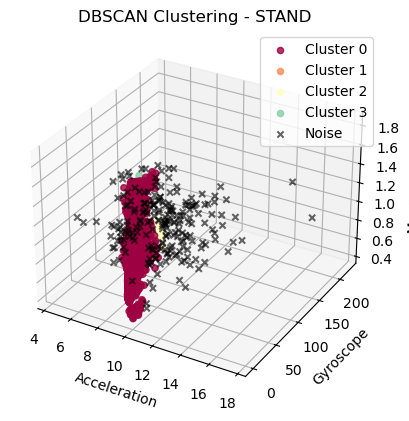

 Atividade SIT tem 421504 pontos. Reduzindo para 30000...

🔍 Testando configurações DBSCAN para atividade: SIT (30000 pontos)
   Testando eps=0.3, min_samples=5... ✓ clusters=5, noise=251
   Testando eps=0.3, min_samples=10... ✓ clusters=3, noise=323
   Testando eps=0.3, min_samples=15... ✓ clusters=2, noise=374
   Testando eps=0.5, min_samples=5... ✓ clusters=3, noise=152
   Testando eps=0.5, min_samples=10... ✓ clusters=1, noise=180
   Testando eps=0.5, min_samples=15... ✓ clusters=1, noise=196
   Testando eps=1.0, min_samples=5... ✓ clusters=2, noise=93
   Testando eps=1.0, min_samples=10... ✓ clusters=1, noise=117
   Testando eps=1.0, min_samples=15... ✓ clusters=1, noise=124
Atividade: SIT, Epslon: 0.3, Min Samples: 10, Clusters: 3, Outliers: 323


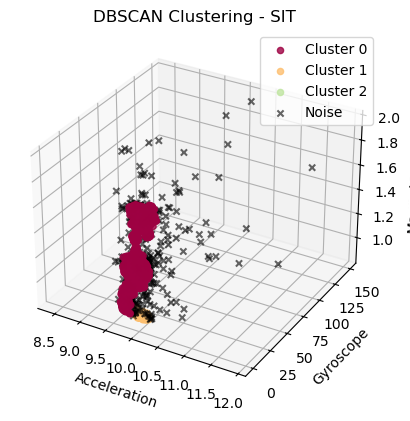

 Atividade SIT AND TALK tem 418688 pontos. Reduzindo para 30000...

🔍 Testando configurações DBSCAN para atividade: SIT AND TALK (30000 pontos)
   Testando eps=0.3, min_samples=5... ✓ clusters=7, noise=388
   Testando eps=0.3, min_samples=10... ✓ clusters=1, noise=574
   Testando eps=0.3, min_samples=15... ✓ clusters=1, noise=667
   Testando eps=0.5, min_samples=5... ✓ clusters=4, noise=202
   Testando eps=0.5, min_samples=10... ✓ clusters=1, noise=279
   Testando eps=0.5, min_samples=15... ✓ clusters=1, noise=318
   Testando eps=1.0, min_samples=5... ✓ clusters=1, noise=113
   Testando eps=1.0, min_samples=10... ✓ clusters=1, noise=133
   Testando eps=1.0, min_samples=15... ✓ clusters=1, noise=141
Atividade: SIT AND TALK, Epslon: 0.5, Min Samples: 5, Clusters: 4, Outliers: 202


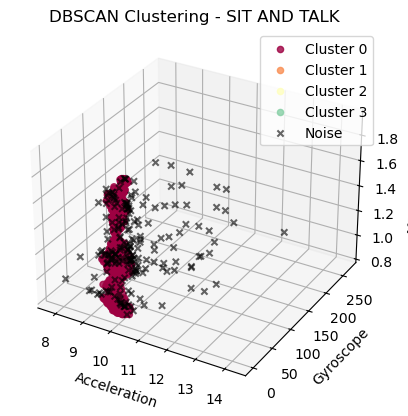

 Atividade WALK tem 699414 pontos. Reduzindo para 30000...

🔍 Testando configurações DBSCAN para atividade: WALK (30000 pontos)
   Testando eps=0.3, min_samples=5... ✓ clusters=16, noise=929
   Testando eps=0.3, min_samples=10... ✓ clusters=12, noise=1675
   Testando eps=0.3, min_samples=15... ✓ clusters=5, noise=2416
   Testando eps=0.5, min_samples=5... ✓ clusters=5, noise=248
   Testando eps=0.5, min_samples=10... ✓ clusters=2, noise=376
   Testando eps=0.5, min_samples=15... ✓ clusters=1, noise=540
   Testando eps=1.0, min_samples=5... ✓ clusters=1, noise=24
   Testando eps=1.0, min_samples=10... ✓ clusters=1, noise=37
   Testando eps=1.0, min_samples=15... ✓ clusters=1, noise=55
Atividade: WALK, Epslon: 0.5, Min Samples: 10, Clusters: 2, Outliers: 376


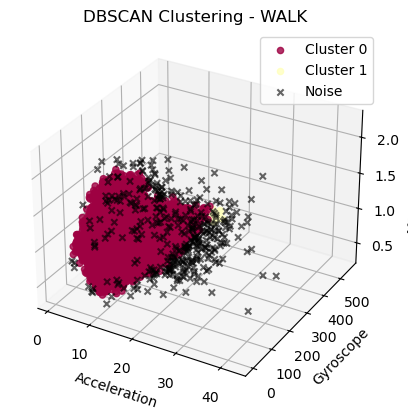

 Atividade WALK AND TALK tem 703766 pontos. Reduzindo para 30000...

🔍 Testando configurações DBSCAN para atividade: WALK AND TALK (30000 pontos)
   Testando eps=0.3, min_samples=5... ✓ clusters=24, noise=903
   Testando eps=0.3, min_samples=10... ✓ clusters=9, noise=1828
   Testando eps=0.3, min_samples=15... ✓ clusters=7, noise=2494
   Testando eps=0.5, min_samples=5... ✓ clusters=4, noise=198
   Testando eps=0.5, min_samples=10... ✓ clusters=1, noise=372
   Testando eps=0.5, min_samples=15... ✓ clusters=2, noise=555
   Testando eps=1.0, min_samples=5... ✓ clusters=1, noise=27
   Testando eps=1.0, min_samples=10... ✓ clusters=1, noise=47
   Testando eps=1.0, min_samples=15... ✓ clusters=1, noise=60
Atividade: WALK AND TALK, Epslon: 0.5, Min Samples: 5, Clusters: 4, Outliers: 198


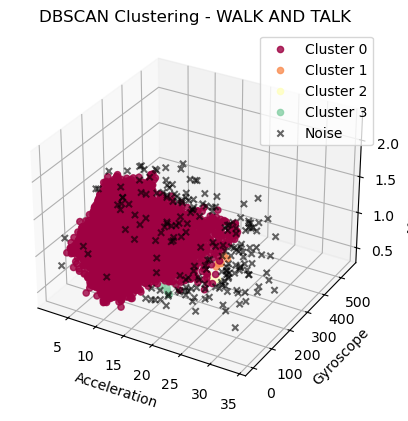

 Atividade CLIMB STAIR (UP/DOWN) tem 446411 pontos. Reduzindo para 30000...

🔍 Testando configurações DBSCAN para atividade: CLIMB STAIR (UP/DOWN) (30000 pontos)
   Testando eps=0.3, min_samples=5... ✓ clusters=19, noise=852
   Testando eps=0.3, min_samples=10... ✓ clusters=2, noise=1444
   Testando eps=0.3, min_samples=15... ✓ clusters=5, noise=2000
   Testando eps=0.5, min_samples=5... ✓ clusters=6, noise=249
   Testando eps=0.5, min_samples=10... ✓ clusters=2, noise=375
   Testando eps=0.5, min_samples=15... ✓ clusters=2, noise=518
   Testando eps=1.0, min_samples=5... ✓ clusters=1, noise=28
   Testando eps=1.0, min_samples=10... ✓ clusters=1, noise=40
   Testando eps=1.0, min_samples=15... ✓ clusters=1, noise=54
Atividade: CLIMB STAIR (UP/DOWN), Epslon: 0.3, Min Samples: 10, Clusters: 2, Outliers: 1444


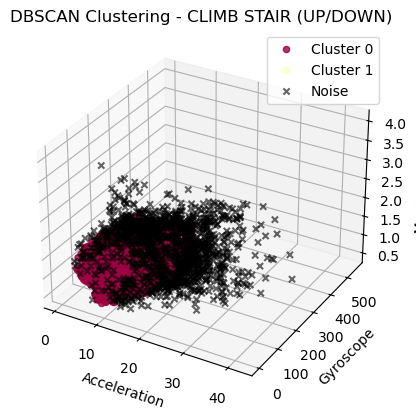

 Atividade CLIMB STAIR (UP/DOWN) AND TALK tem 223179 pontos. Reduzindo para 30000...

🔍 Testando configurações DBSCAN para atividade: CLIMB STAIR (UP/DOWN) AND TALK (30000 pontos)
   Testando eps=0.3, min_samples=5... ✓ clusters=36, noise=859
   Testando eps=0.3, min_samples=10... ✓ clusters=8, noise=1595
   Testando eps=0.3, min_samples=15... ✓ clusters=2, noise=2275
   Testando eps=0.5, min_samples=5... ✓ clusters=4, noise=203
   Testando eps=0.5, min_samples=10... ✓ clusters=2, noise=368
   Testando eps=0.5, min_samples=15... ✓ clusters=1, noise=537
   Testando eps=1.0, min_samples=5... ✓ clusters=1, noise=22
   Testando eps=1.0, min_samples=10... ✓ clusters=1, noise=39
   Testando eps=1.0, min_samples=15... ✓ clusters=1, noise=54
Atividade: CLIMB STAIR (UP/DOWN) AND TALK, Epslon: 0.5, Min Samples: 5, Clusters: 4, Outliers: 203


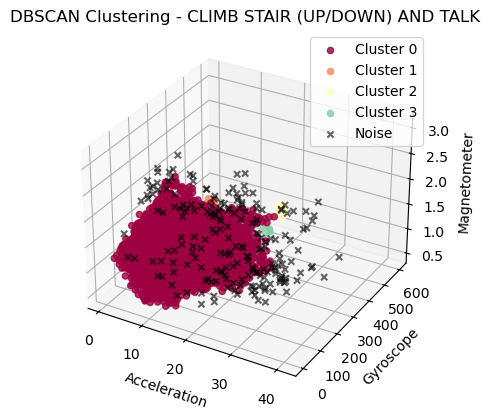

 Atividade STAND->SIT tem 30976 pontos. Reduzindo para 30000...

🔍 Testando configurações DBSCAN para atividade: STAND->SIT (30000 pontos)
   Testando eps=0.3, min_samples=5... ✓ clusters=40, noise=1055
   Testando eps=0.3, min_samples=10... ✓ clusters=13, noise=1912
   Testando eps=0.3, min_samples=15... ✓ clusters=5, noise=2378
   Testando eps=0.5, min_samples=5... ✓ clusters=7, noise=335
   Testando eps=0.5, min_samples=10... ✓ clusters=4, noise=618
   Testando eps=0.5, min_samples=15... ✓ clusters=3, noise=849
   Testando eps=1.0, min_samples=5... ✓ clusters=5, noise=70
   Testando eps=1.0, min_samples=10... ✓ clusters=1, noise=145
   Testando eps=1.0, min_samples=15... ✓ clusters=1, noise=177
Atividade: STAND->SIT, Epslon: 0.5, Min Samples: 10, Clusters: 4, Outliers: 618


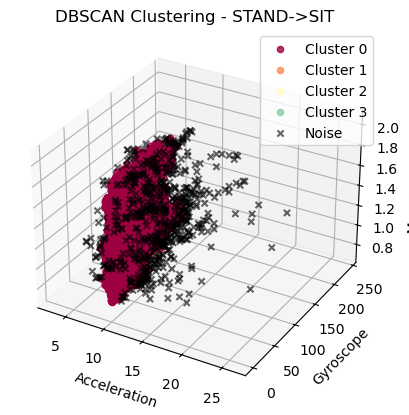


🔍 Testando configurações DBSCAN para atividade: SIT->STAND (28032 pontos)
   Testando eps=0.3, min_samples=5... ✓ clusters=34, noise=1018
   Testando eps=0.3, min_samples=10... ✓ clusters=9, noise=1764
   Testando eps=0.3, min_samples=15... ✓ clusters=4, noise=2253
   Testando eps=0.5, min_samples=5... ✓ clusters=15, noise=353
   Testando eps=0.5, min_samples=10... ✓ clusters=4, noise=678
   Testando eps=0.5, min_samples=15... ✓ clusters=2, noise=865
   Testando eps=1.0, min_samples=5... ✓ clusters=3, noise=56
   Testando eps=1.0, min_samples=10... ✓ clusters=2, noise=120
   Testando eps=1.0, min_samples=15... ✓ clusters=2, noise=184
Atividade: SIT->STAND, Epslon: 0.3, Min Samples: 15, Clusters: 4, Outliers: 2253


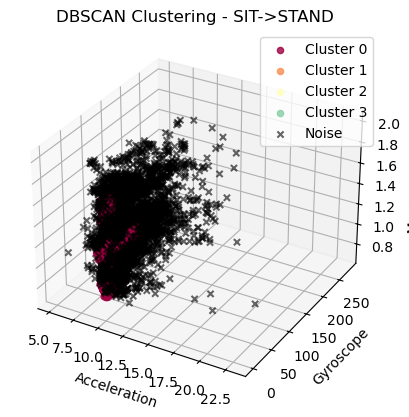


🔍 Testando configurações DBSCAN para atividade: STAND->SIT AND TALK (29952 pontos)
   Testando eps=0.3, min_samples=5... ✓ clusters=33, noise=1003
   Testando eps=0.3, min_samples=10... ✓ clusters=15, noise=1864
   Testando eps=0.3, min_samples=15... ✓ clusters=7, noise=2492
   Testando eps=0.5, min_samples=5... ✓ clusters=8, noise=316
   Testando eps=0.5, min_samples=10... ✓ clusters=4, noise=542
   Testando eps=0.5, min_samples=15... ✓ clusters=1, noise=787
   Testando eps=1.0, min_samples=5... ✓ clusters=5, noise=49
   Testando eps=1.0, min_samples=10... ✓ clusters=1, noise=106
   Testando eps=1.0, min_samples=15... ✓ clusters=1, noise=143
Atividade: STAND->SIT AND TALK, Epslon: 0.5, Min Samples: 10, Clusters: 4, Outliers: 542


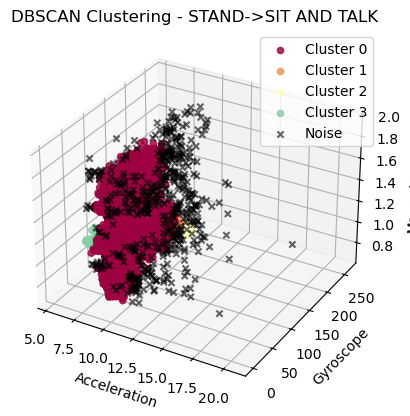


🔍 Testando configurações DBSCAN para atividade: SIT->STAND AND TALK (28160 pontos)
   Testando eps=0.3, min_samples=5... ✓ clusters=30, noise=1126
   Testando eps=0.3, min_samples=10... ✓ clusters=12, noise=1932
   Testando eps=0.3, min_samples=15... ✓ clusters=6, noise=2565
   Testando eps=0.5, min_samples=5... ✓ clusters=16, noise=336
   Testando eps=0.5, min_samples=10... ✓ clusters=6, noise=678
   Testando eps=0.5, min_samples=15... ✓ clusters=4, noise=909
   Testando eps=1.0, min_samples=5... ✓ clusters=3, noise=36
   Testando eps=1.0, min_samples=10... ✓ clusters=1, noise=89
   Testando eps=1.0, min_samples=15... ✓ clusters=1, noise=146
Atividade: SIT->STAND AND TALK, Epslon: 0.5, Min Samples: 15, Clusters: 4, Outliers: 909


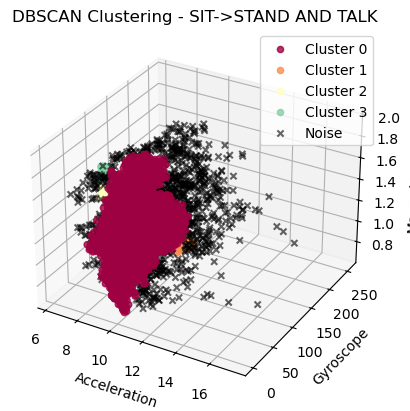


🔍 Testando configurações DBSCAN para atividade: STAND->WALK (19050 pontos)
   Testando eps=0.3, min_samples=5... ✓ clusters=18, noise=675
   Testando eps=0.3, min_samples=10... ✓ clusters=5, noise=1246
   Testando eps=0.3, min_samples=15... ✓ clusters=2, noise=1753
   Testando eps=0.5, min_samples=5... ✓ clusters=2, noise=163
   Testando eps=0.5, min_samples=10... ✓ clusters=2, noise=281
   Testando eps=0.5, min_samples=15... ✓ clusters=2, noise=406
   Testando eps=1.0, min_samples=5... ✓ clusters=2, noise=35
   Testando eps=1.0, min_samples=10... ✓ clusters=1, noise=44
   Testando eps=1.0, min_samples=15... ✓ clusters=1, noise=56
Atividade: STAND->WALK, Epslon: 0.3, Min Samples: 15, Clusters: 2, Outliers: 1753


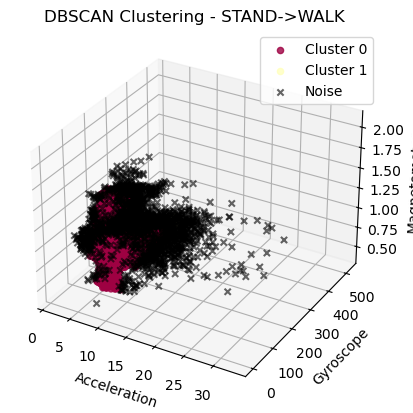

 Atividade WALK->STAND tem 38100 pontos. Reduzindo para 30000...

🔍 Testando configurações DBSCAN para atividade: WALK->STAND (30000 pontos)
   Testando eps=0.3, min_samples=5... ✓ clusters=16, noise=743
   Testando eps=0.3, min_samples=10... ✓ clusters=3, noise=954
   Testando eps=0.3, min_samples=15... ✓ clusters=3, noise=1076
   Testando eps=0.5, min_samples=5... ✓ clusters=12, noise=399
   Testando eps=0.5, min_samples=10... ✓ clusters=4, noise=554
   Testando eps=0.5, min_samples=15... ✓ clusters=1, noise=720
   Testando eps=1.0, min_samples=5... ✓ clusters=10, noise=154
   Testando eps=1.0, min_samples=10... ✓ clusters=1, noise=272
   Testando eps=1.0, min_samples=15... ✓ clusters=1, noise=302
Atividade: WALK->STAND, Epslon: 0.5, Min Samples: 10, Clusters: 4, Outliers: 554


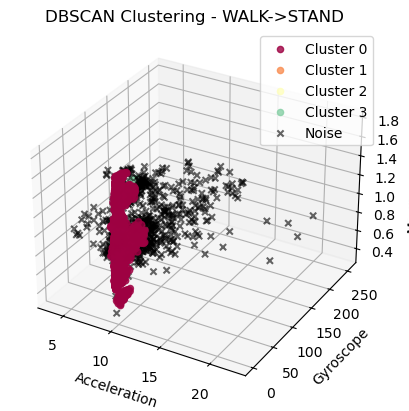


🔍 Testando configurações DBSCAN para atividade: STAND->CLIMB STAIRS (UP/DOWN), STAND->CLIMB STAIRS (UP/DOWN) AND TALK (19050 pontos)
   Testando eps=0.3, min_samples=5... ✓ clusters=24, noise=639
   Testando eps=0.3, min_samples=10... ✓ clusters=5, noise=1314
   Testando eps=0.3, min_samples=15... ✓ clusters=4, noise=1866
   Testando eps=0.5, min_samples=5... ✓ clusters=5, noise=162
   Testando eps=0.5, min_samples=10... ✓ clusters=2, noise=323
   Testando eps=0.5, min_samples=15... ✓ clusters=2, noise=445
   Testando eps=1.0, min_samples=5... ✓ clusters=1, noise=24
   Testando eps=1.0, min_samples=10... ✓ clusters=1, noise=41
   Testando eps=1.0, min_samples=15... ✓ clusters=1, noise=51
Atividade: STAND->CLIMB STAIRS (UP/DOWN), STAND->CLIMB STAIRS (UP/DOWN) AND TALK, Epslon: 0.3, Min Samples: 15, Clusters: 4, Outliers: 1866


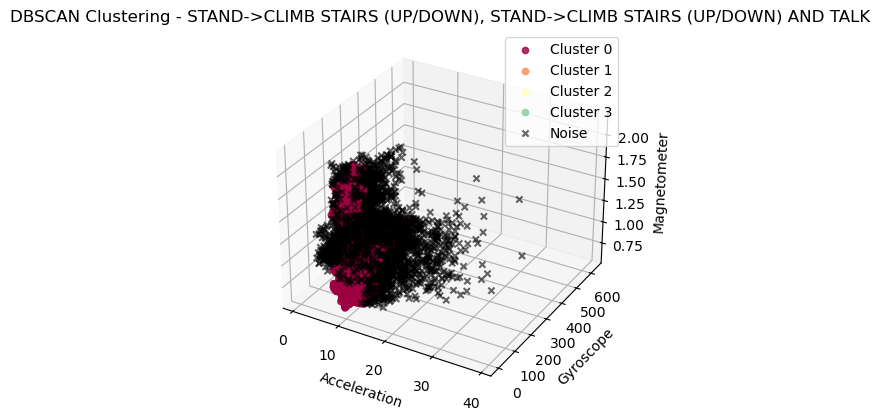


🔍 Testando configurações DBSCAN para atividade: CLIMB STAIRS (UP/DOWN)->WALK (9525 pontos)
   Testando eps=0.3, min_samples=5... ✓ clusters=14, noise=624
   Testando eps=0.3, min_samples=10... ✓ clusters=6, noise=1104
   Testando eps=0.3, min_samples=15... ✓ clusters=3, noise=1556
   Testando eps=0.5, min_samples=5... ✓ clusters=7, noise=201
   Testando eps=0.5, min_samples=10... ✓ clusters=3, noise=355
   Testando eps=0.5, min_samples=15... ✓ clusters=1, noise=448
   Testando eps=1.0, min_samples=5... ✓ clusters=3, noise=23
   Testando eps=1.0, min_samples=10... ✓ clusters=1, noise=53
   Testando eps=1.0, min_samples=15... ✓ clusters=1, noise=78
Atividade: CLIMB STAIRS (UP/DOWN)->WALK, Epslon: 0.3, Min Samples: 15, Clusters: 3, Outliers: 1556


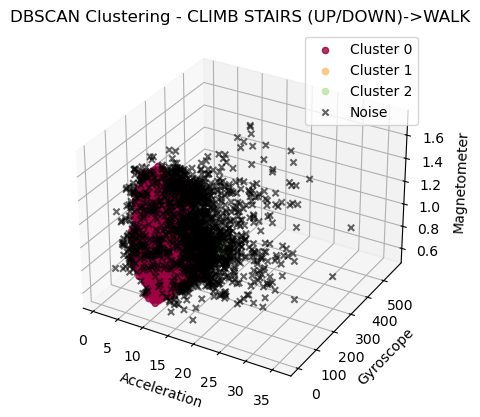


🔍 Testando configurações DBSCAN para atividade: CLIMB STAIRS (UP/DOWN) AND TALK->WALK AND TALK (9525 pontos)
   Testando eps=0.3, min_samples=5... ✓ clusters=21, noise=697
   Testando eps=0.3, min_samples=10... ✓ clusters=10, noise=1254
   Testando eps=0.3, min_samples=15... ✓ clusters=4, noise=1679
   Testando eps=0.5, min_samples=5... ✓ clusters=5, noise=194
   Testando eps=0.5, min_samples=10... ✓ clusters=2, noise=390
   Testando eps=0.5, min_samples=15... ✓ clusters=2, noise=486
   Testando eps=1.0, min_samples=5... ✓ clusters=1, noise=20
   Testando eps=1.0, min_samples=10... ✓ clusters=1, noise=41
   Testando eps=1.0, min_samples=15... ✓ clusters=1, noise=59
Atividade: CLIMB STAIRS (UP/DOWN) AND TALK->WALK AND TALK, Epslon: 0.3, Min Samples: 15, Clusters: 4, Outliers: 1679


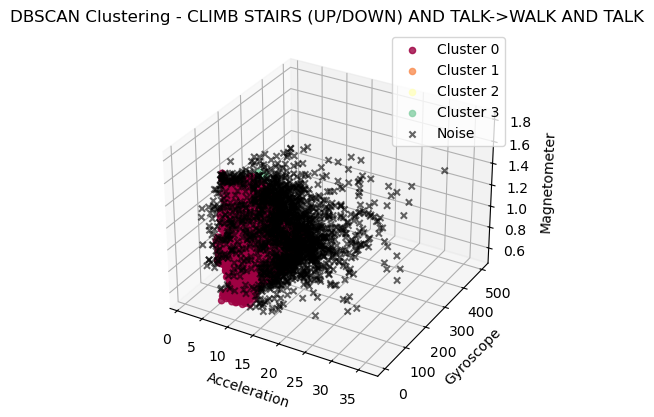

In [ ]:
def main_exercicio_3_7_1():
    """Executa DBSCAN e visualiza os resultados"""
    dataset = loadData(None)
    
    if not dataset:
        print("Nenhum dado carregado!")
        return
    
    print("\n=== DBSCAN Clustering ===")
    dbscanVisualization(dataset)

main_exercicio_3_7_1()